In [160]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

%matplotlib inline

In [161]:
# Cargo el CSV
df = pd.read_csv("HousingData.csv")

""" Nombres de las columnas:

CRIM - Tasa de delincuencia per cápita por ciudad.
ZN - Proporción de suelo residencial zonificado para lotes de más de 25 mil pies cuadrados.
INDUS - Proporción de acres comerciales no minoristas por ciudad.
CHAS - Variable ficticia del río Charles (1 si la zona es colindante con el rio, 0 en caso contrario).
NOX - Concentración de óxidos nítricos (Partes por 10 millones).
RM - Número medio de habitaciones por vivienda.
AGE - Proporción de unidades ocupadas por sus propietarios construidas antes de 1940
DIS - Distancias ponderadas a cinco centros de empleo de Boston.
RAD - Índice de accesibilidad a autopistas radiales.
TAX - Tipo del impuesto sobre bienes inmuebles de valor íntegro por 10.000 $.
PTRATIO - Ratio de alumnos-profesor por ciudad.
B - 1000(Bk - 0.63)^2 donde Bk es la proporción de poblacion negra en la ciudad.
LSTAT - % de población de estatus más bajo.
MEDV - Valor medio de las viviendas ocupadas por sus propietarios en miles de $.

https://www.cs.toronto.edu/~delve/data/boston/bostonDetail.html#:~:text=The%20Boston%20Housing%20Dataset,the%20area%20of%20Boston%20Mass


Nuestra variable dependiente va a ser MEDV, por que el objetivo es predecir el valor medio de las viviendas. 
"""
# Muestro las primeras 5 filas del dataset
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,NaN,36.2


In [162]:
# Recojo información acerca del dataset
df.info()

# Todas las columnas son de tipo numérico, por lo que no hace falta usar definir variables categóricas

# Recojo información sobre la media, desviación estándar, etc.
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     486 non-null    float64
 1   ZN       486 non-null    float64
 2   INDUS    486 non-null    float64
 3   CHAS     486 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      486 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    486 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,486.000000,486.000000,486.000000,486.000000,506.000000,506.000000,486.000000,506.000000,506.000000,506.000000,506.000000,506.000000,486.000000,506.000000
mean,3.611874,11.211934,11.083992,0.069959,0.554695,6.284634,68.518519,3.795043,9.549407,408.237154,18.455534,356.674032,12.715432,22.532806
std,8.720192,23.388876,6.835896,0.255340,0.115878,0.702617,27.999513,2.105710,8.707259,168.537116,2.164946,91.294864,7.155871,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.081900,0.000000,5.190000,0.000000,0.449000,5.885500,45.175000,2.100175,4.000000,279.000000,17.400000,375.377500,7.125000,17.025000
50%,0.253715,0.000000,9.690000,0.000000,0.538000,6.208500,76.800000,3.207450,5.000000,330.000000,19.050000,391.440000,11.430000,21.200000
75%,3.560263,12.500000,18.100000,0.000000,0.624000,6.623500,93.975000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [163]:
# ¿Hay valores faltantes / nulos en el dataset?
print(f"Numero de valores faltantes:\n{df.isna().sum()}\n")

# ¿Hay duplicados en el dataset?
print(f"Numero de duplicados: {df.duplicated().sum()}")

# Hay 20 valores faltantes en: CRIM, ZN, INDUS, CHAS Y AGE
# Quito los valores faltantes

df_dropped=df.dropna()

df_dropped.head()

Numero de valores faltantes:
CRIM       20
ZN         20
INDUS      20
CHAS       20
NOX         0
RM          0
AGE        20
DIS         0
RAD         0
TAX         0
PTRATIO     0
B           0
LSTAT      20
MEDV        0
dtype: int64

Numero de duplicados: 0


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
5,0.02985,0.0,2.18,0.0,0.458,6.430,58.7,6.0622,3,222,18.7,394.12,5.21,28.7


             MEDV
CRIM    -0.397230
ZN       0.406822
INDUS   -0.510829
CHAS     0.173701
NOX     -0.459054
RM       0.723951
AGE     -0.407470
DIS      0.279547
RAD     -0.416638
TAX     -0.508864
PTRATIO -0.543809
B        0.347256
LSTAT   -0.743450
MEDV     1.000000


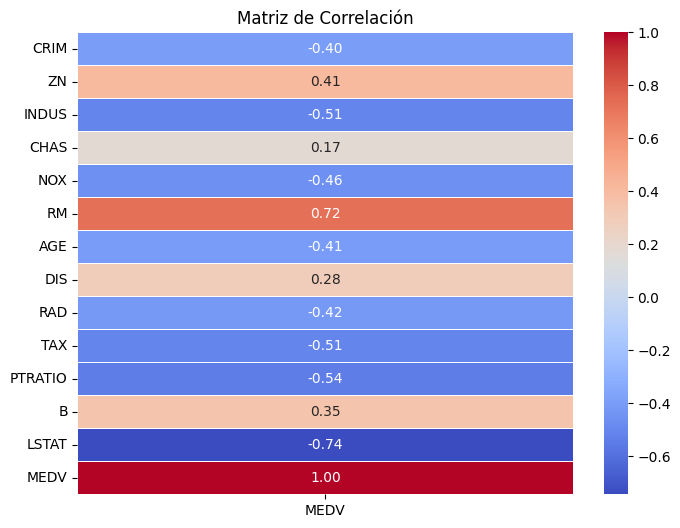

' \n· Si una variable tiene baja correlación con MedHouseVal (<0.1) → Puede no ser relevante y podríamos eliminarla.\n· Si dos variables tienen correlación alta entre sí (>0.8) → Puede haber colinealidad y deberíamos eliminar una de ellas.\n\nEn este caso, no hay ninguna variable que entre en cualquiera de los dos casos, asi que no voy a eliminar ninguna '

In [164]:
#Matriz de correlacion completa
# En este caso, voy a ver la correlación que tienen las variables con la variable objetivo "MEDV"

corr = df_dropped.corr()[["MEDV"]]

print(corr)
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Matriz de Correlación")
plt.show() 

""" 
· Si una variable tiene baja correlación con MedHouseVal (<0.1) → Puede no ser relevante y podríamos eliminarla.
· Si dos variables tienen correlación alta entre sí (>0.8) → Puede haber colinealidad y deberíamos eliminar una de ellas.

En este caso, no hay ninguna variable que entre en cualquiera de los dos casos, asi que no voy a eliminar ninguna """



In [165]:
# PROFILE REPORT

profile = ProfileReport(df_dropped, title="Boston Housing")

profile.to_notebook_iframe() 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<?, ?it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

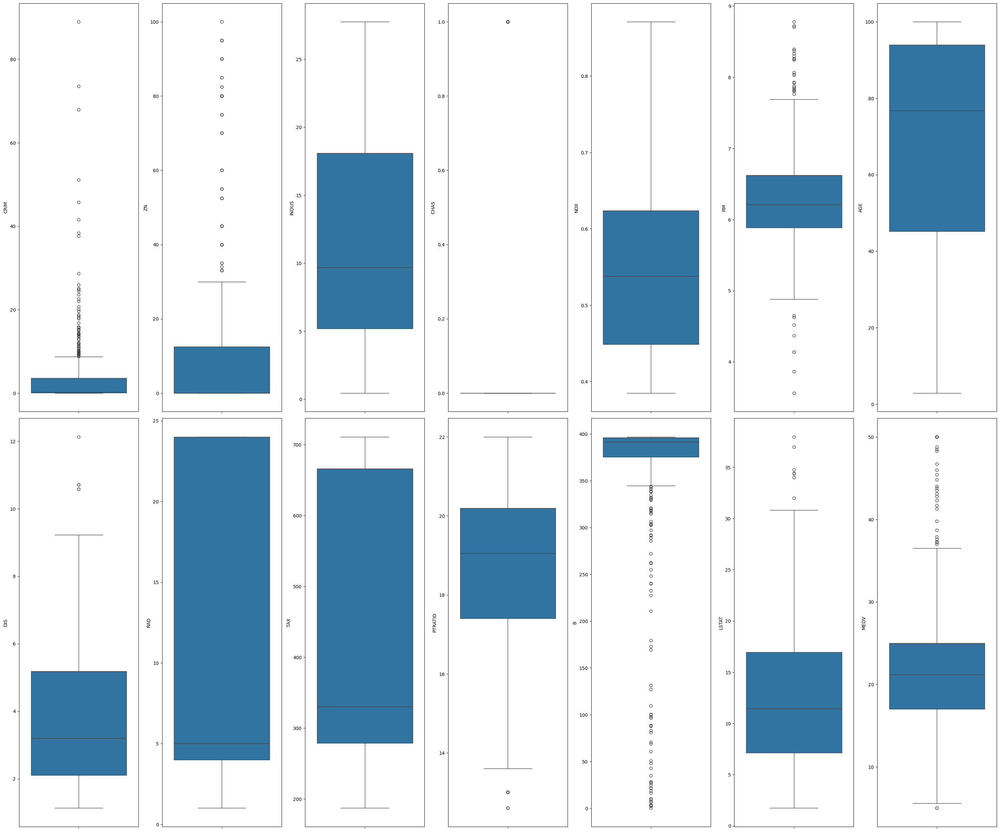

In [166]:
""" En este caso, voy a ver si todas las columnas tienen outliers """

# ¿Tienen los datos outliers?
# Columnas: CRIM, ZN, INDUS, CHAS, NOX, RM, AGE, DIS, RAD, TAX, PTRATIO, B,LSTAT, MEDV - 14 Columnas
fig, axs = plt.subplots(2,7, figsize=(30, 25))
axs = axs.flatten()

for i, col in enumerate(df.columns):
    sns.boxplot(y=df[col], ax=axs[i])

fig.tight_layout()
plt.show()
# Cuentan con outliers, pero en este caso no voy a winsorizarlos.


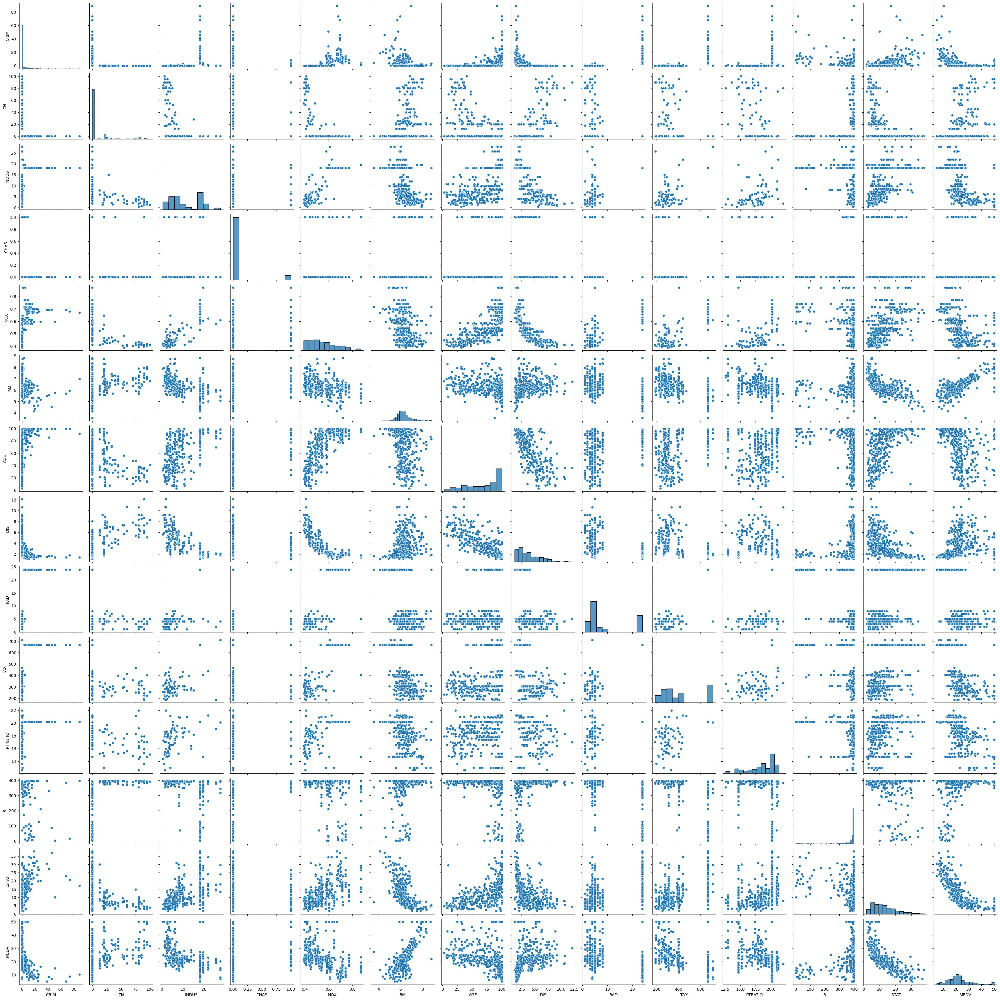

In [167]:
# Ahora voy a ver cuanta linealidad tienen todas las variables

sns.pairplot(df_dropped, vars = ["CRIM", "ZN", "INDUS", "CHAS", "NOX", "RM", "AGE", "DIS", "RAD", "TAX", "PTRATIO", "B","LSTAT", "MEDV"])


In [168]:
# Creo la variable predictora e independiente 
X = df_dropped.drop(columns=["MEDV"])
y = df_dropped["MEDV"]

# Ahora voy a escalar las variables para mejorar la estabilidad del modelo

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


#Ahora voy a calcular el VIF para cada variable independiente
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X_scaled, i) for i in range(X_scaled.shape[1])]

print(vif_data)

""" 
· VIF < 5 → No hay problema de colinealidad.
· VIF entre 5 y 10 → Hay colinealidad moderada, revisar.
· VIF > 10 → Fuerte colinealidad, se recomienda eliminar la variable. 
"""

# Siguiendo estas pautas, las unicas variables que son "peligrosas" son Rad y Tax, pero por ahora, las voy a dejar


   Variable       VIF
0      CRIM  1.741404
1        ZN  2.321843
2     INDUS  4.049690
3      CHAS  1.069182
4       NOX  4.495772
5        RM  2.107004
6       AGE  3.173844
7       DIS  3.827427
8       RAD  6.986683
9       TAX  8.651382
10  PTRATIO  1.810597
11        B  1.372310
12    LSTAT  3.156334


' \n· VIF < 5 → No hay problema de colinealidad.\n· VIF entre 5 y 10 → Hay colinealidad moderada, revisar.\n· VIF > 10 → Fuerte colinealidad, se recomienda eliminar la variable. \n'

In [169]:
# Hago la división de los datos
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Defino el modelo
modelo = LinearRegression() 

# Entreno el modelo
modelo.fit(X_train, y_train)  

# Obtengo los coeficientes
coeficientes = pd.Series(modelo.coef_, index=X.columns)

# Muestro el intercepto y los coeficientes
print("Intercepto:", modelo.intercept_)
print("Coeficientes:")
print(coeficientes)

# Realizo las predicciones
predicciones = modelo.predict(X_test)  

#Promedio de error absoluto
mae = mean_absolute_error(y_test, predicciones)

# Coeficiente de determinación
r2 = r2_score(y_test, predicciones)  

# Error cuadrático medio
mse = mean_squared_error(y_test, predicciones)  

# Raiz del error cuadrático medio
rmse = np.sqrt(mean_squared_error(y_test, predicciones))  

# Error en porcentaje
mape = np.mean(np.abs((y_test - predicciones) / y_test)) * 100  

print(f"MAE: {mae:.2f}")
print(f"Coeficiente de determinación (R^2):{r2:.2f}")
print(f"Error cuadrático medio (MSE):{mse:.2f}")
print(f"Raiz de error cuadrático medio (RMSE):{rmse:.2f}")
print(f"Error de porcentaje medio (MAPE):{mape:.2f}")



Intercepto: 33.65240504056566
Coeficientes:
CRIM       -0.112187
ZN          0.042440
INDUS       0.025673
CHAS        1.983837
NOX       -17.079257
RM          4.258091
AGE        -0.021741
DIS        -1.424189
RAD         0.235588
TAX        -0.011997
PTRATIO    -0.975835
B           0.009594
LSTAT      -0.388620
dtype: float64
MAE: 3.37
Coeficiente de determinación (R^2):0.63
Error cuadrático medio (MSE):31.45
Raiz de error cuadrático medio (RMSE):5.61
Error de porcentaje medio (MAPE):14.66


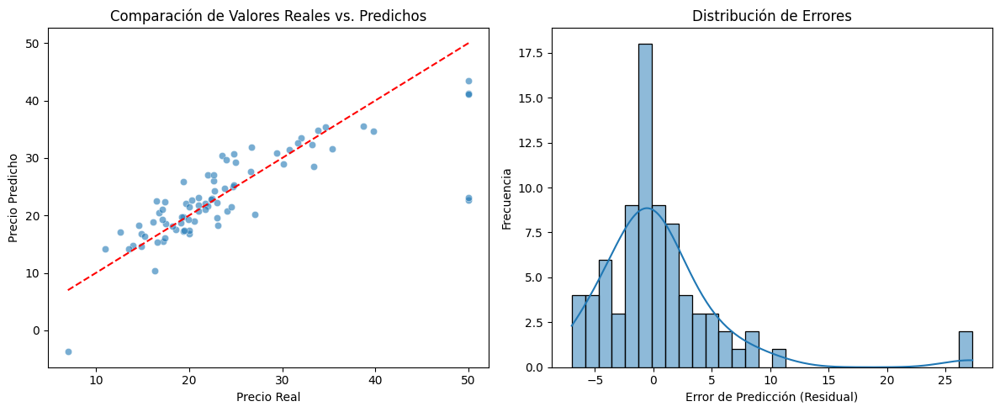

In [170]:
# Visualización
plt.figure(figsize=(12, 5))

# Gráfico de dispersión valores reales vs predichos
plt.subplot(1, 2, 1)
sns.scatterplot(x=y_test, y=predicciones, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Precio Real")
plt.ylabel("Precio Predicho")
plt.title("Comparación de Valores Reales vs. Predichos")

# Histograma de errores
plt.subplot(1, 2, 2)
sns.histplot(y_test - predicciones, bins=30, kde=True)
plt.xlabel("Error de Predicción (Residual)")
plt.ylabel("Frecuencia")
plt.title("Distribución de Errores")

plt.tight_layout()
plt.show()